# Import Useful Libraries

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle
import os

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

# Used Paths

In [2]:
CameraCalibrationPath = './camera_cal/calibration*.jpg'
TestImagesPath = "test_images/"

# Get Corner points

In [3]:
def get_corners (image, NumRows, NumCols):
    # Read images.
    normal_image = mpimg.imread(image)
    # convert images to grayscale.
    gray = cv2.cvtColor(normal_image,cv2.COLOR_BGR2GRAY)
    # find chessboard corners in the image
    ret, corners = cv2.findChessboardCorners(gray, (NumRows,NumCols), None)
    if ret == True:
        # if corners found draw them on the image
        corner_img = cv2.drawChessboardCorners(normal_image, (NumRows,NumCols), corners, ret)
    else:
        # if corners weren't found return the normal image.
        corner_img = normal_image
    return corner_img, ret, corners

# Camera Calibration and undistort images

In [4]:
def calibrate_undistort_images(ImageCorner, ObjPoints, ImgPoints ):
    
    img_size = (ImageCorner.shape[1], ImageCorner.shape[0])
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(ObjPoints, ImgPoints, img_size, None, None)
    
    undistort_image = cv2.undistort(ImageCorner, mtx, dist, None, mtx)
    
    return undistort_image, mtx, dist

# Undistort Image

In [5]:
def undistort_image(Image, Matx, Dist):
    undistort_image = cv2.undistort(Image, Matx, Dist, None, Matx)
    return undistort_image

# Perspective Transform

In [6]:
def warper(Image, SourcePoints, DestinationPoints):
    
    image_size = (Image.shape[1],Image.shape[0])
    # Get the transform matrix.
    M = cv2.getPerspectiveTransform(SourcePoints, DestinationPoints)
    # Get the inverse transform matrix.
    Minv = cv2.getPerspectiveTransform(DestinationPoints, SourcePoints)
    
    warped = cv2.warpPerspective(Image, M, image_size)
    
    return warped, M ,Minv

# Get Calibration Coefficients

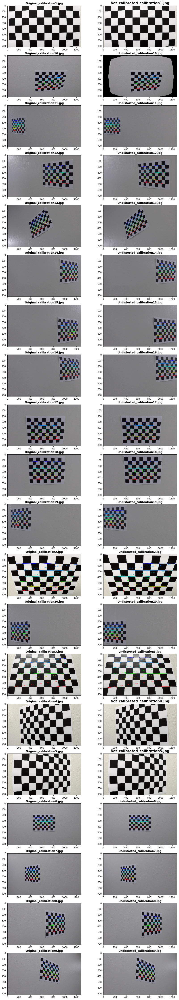

In [7]:
# number of rows & columns of cheese board.
num_rows = 9 # rows corners in the chessboard
num_cols = 6 # columns corners in the chessboard

# Arrays to store object points and image points from all the images.
obj_points = [] # 3D points in real world space 
img_points = [] # 2D points in image plane

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((num_cols*num_rows,3), np.float32)
objp[:,:2] = np.mgrid[0:num_rows,0:num_cols].T.reshape(-1,2)

# Read images from camera_cal folder 
images = glob.glob(CameraCalibrationPath)

f, axs = plt.subplots(20, 2, figsize=(15,70))
f.subplots_adjust(hspace = .2, wspace=.05, top=1)

for index, image in enumerate(images):
    # get image corners if exist
    img_corner, ret, corner_points = get_corners(image,num_rows,num_cols)
    
    # plot images before calibrating
    axs[index,0].set_title("Original_" + image.split('./camera_cal\\')[1],fontsize=12,fontweight='bold')
    axs[index,0].imshow(img_corner)
    
    if ret == True:
        obj_points.append(objp)
        img_points.append(corner_points)
        
        undistorted_image, camera_mtx, dist_coff = calibrate_undistort_images(img_corner, obj_points, img_points)
        # plot calibrated images
  
        axs[index,1].set_title("Undistorted_" + image.split('./camera_cal\\')[1],fontsize=12,fontweight='bold')
        axs[index,1].imshow(undistorted_image)

    else:
        axs[index,1].set_title("Not_calibrated_" + image.split('./camera_cal\\')[1],fontsize=15,fontweight='bold')
        axs[index,1].imshow(img_corner)    
plt.show()

dict_pickle = {}
dict_pickle["mtx"]  = camera_mtx
dict_pickle["dist"] = dist_coff
pickle.dump(dict_pickle, open("calibration_coefficients.p", 'wb'))


# Load Pickle Data

In [8]:
# Load parameters so we can use them without running the calibration process again.
pickle_load = pickle.load(open("calibration_coefficients.p", 'rb'))

# Visualize Images

In [9]:
def visualize(Image1, TextImage1, Image2, TextImage2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(Image1)
    ax1.set_title(TextImage1, fontsize=30)
    ax2.imshow(Image2)
    ax2.set_title(TextImage2, fontsize=30)

# Test  Perspective Transform 

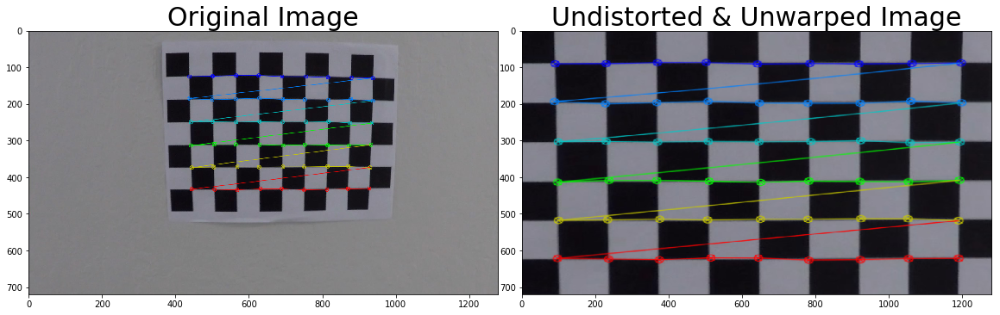

In [10]:
# Test Perspective Transform on a sample image of camera_cal.
cal_num_rows = 9
cal_num_cols = 6
cal_image_path = "camera_cal/calibration18.jpg"
cal_image, cal_ret, cal_corner_points = get_corners(cal_image_path,cal_num_rows,cal_num_cols)
cal_image_size = (cal_image.shape[1], cal_image.shape[0])

# offset for dst points
offset = 100

# source needed for the presepective transform
src = np.float32([cal_corner_points[0], cal_corner_points[cal_num_rows-1], cal_corner_points[-1], cal_corner_points[-cal_num_rows]])

# destination needed for the prespective transform
dest = np.float32([[offset, offset], [cal_image_size[0]-offset, offset], 
                  [cal_image_size[0]-offset, cal_image_size[1]-offset],
                  [offset, cal_image_size[1]-offset]])

if cal_ret == True:
    undist_image = undistort_image(cal_image, pickle_load["mtx"], pickle_load["dist"])
    Unwarped_image, Matx, Matx_inv = warper(undist_image, src, dest)
    visualize(cal_image, "Original Image", Unwarped_image, "Undistorted & Unwarped Image")
    plt.show()

# Gradient Threshold Methods

## 1. Sobel Absolute Threshold

In [11]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
def abs_sobel_thresh(img, orient, sobel_kernel, abs_thresh):
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
        # Take the absolute value of the derivative or gradient
        abs_sobel = np.absolute(sobelx)
    else:
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
        # Take the absolute value of the derivative or gradient
        abs_sobel = np.absolute(sobely)
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    # Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= abs_thresh[0]) & (scaled_sobel <= abs_thresh[1])] = 1        
    
    # Return this mask as your binary_output image
    return binary_output

## 2. Sobel Magnitude Threshold

In [12]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel, mag_thresh):
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Calculate the magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*gradmag/np.max(gradmag))
    
    # Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    # Return this mask as your binary_output image
    return binary_output

## 3. Sobel Direction Threshold

In [13]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel, dir_thresh):
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    absgraddir = np.arctan2(abs_sobely, abs_sobelx)
    
    # Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(absgraddir)
    binary_output[(absgraddir >= dir_thresh[0]) & (absgraddir <= dir_thresh[1])] = 1
    
    # Return this mask as your binary_output image
    return binary_output

# Color Threshold Methods

## 1. LAB Color Method

In [14]:
def lab_select(img, lab_thresh):
    
    # Convert to HLS color space.
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    # B channel is used to detect yellow lines.
    lab_b_channel = lab[:,:,2]
        
    # Create the mask using the boundaries.
    binary_output = np.zeros_like(lab_b_channel)
    binary_output[(lab_b_channel >= lab_thresh[0]) & (lab_b_channel <= lab_thresh[1])] = 1
    
    return binary_output

### Visu

## 2. HLS Color Method

In [15]:
def hls_select(img, hls_thresh):
    
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # Apply a threshold to the l channel
    hls_l_channel = hls[:,:,1]
    
    # Create a binary mask where hls thresholds are met
    binary_output = np.zeros_like(hls_l_channel)
    binary_output[(hls_l_channel > hls_thresh[0]) & (hls_l_channel <= hls_thresh[1])] = 1
    
    # Return a binary image of threshold result
    return binary_output

### Visualize

# Combined Color & Gradient Methods

In [16]:
def combined_thresholds(img):
    #absoulate_threshold_x = abs_sobel_thresh(img, orient = "x", sobel_kernel=9, abs_thresh= (40,150))
    lab_threshold         = lab_select(img, lab_thresh = (145,225))
    hls_threshold         = hls_select(img, hls_thresh = (200,255))
    
    combined_output = np.zeros_like(lab_threshold)
    combined_output[( lab_threshold == 1)|( hls_threshold == 1)] = 1
    
    return combined_output

# Test Images for Distortion, warping and appling color thresholds

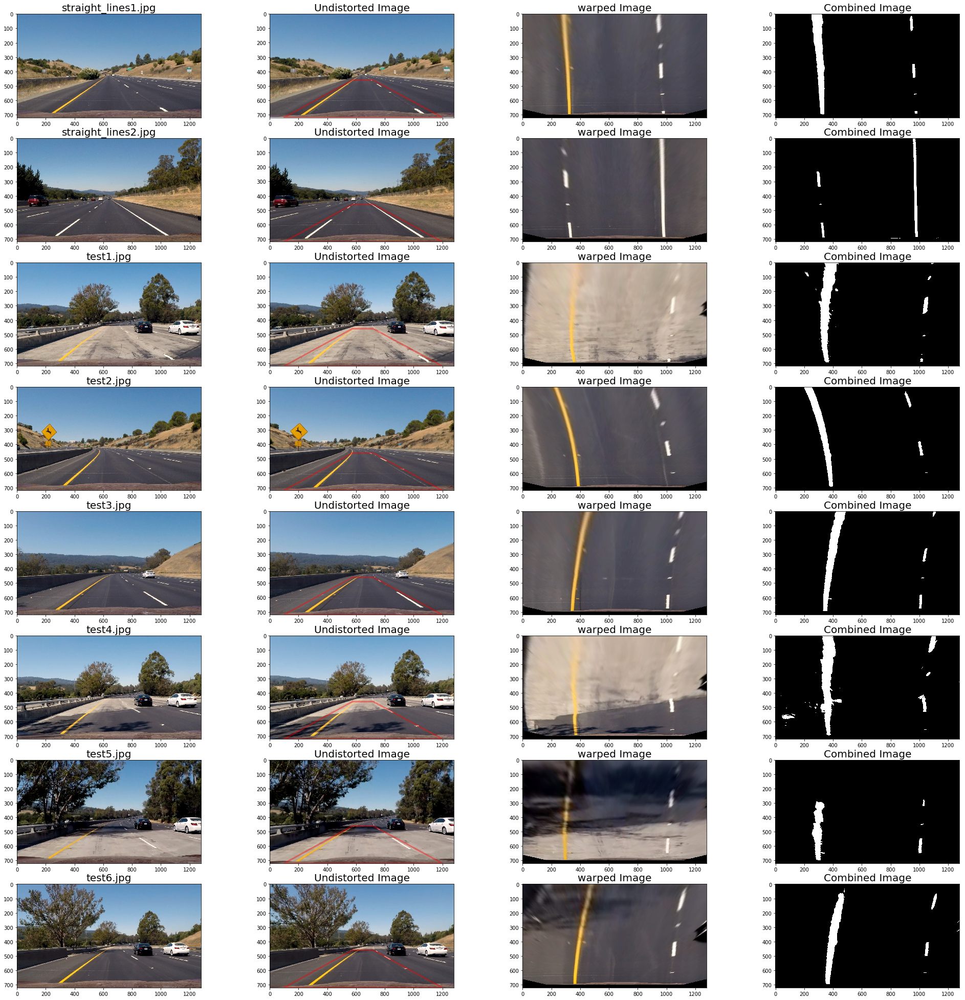

In [17]:
# Testing images in folder test_example.

test_image_path = os.listdir(TestImagesPath)
combined_image_output_list = []
Matx_inv_list = []
# Visualize
f, axs = plt.subplots(8, 4, figsize=(35,35))
f.subplots_adjust(hspace = .2, wspace=.05)

for index,image in enumerate(test_image_path):
    
    # Read an image from test_example folder.
    test_image = mpimg.imread(TestImagesPath+image)
    test_image_size = (cal_image.shape[1], cal_image.shape[0])
    
    # undistort the selected image.
    undist_image = undistort_image(test_image, pickle_load["mtx"], pickle_load["dist"])

    # source needed for the presepective transform
    src = np.float32([(575,460), (720,460), (100,720), (1200,720)])

    # destination needed for the prespective transform
    dest = np.float32([(250,0), 
                       (1050,0), 
                       (250,700), 
                       (1050,700)
                      ])
    
    # warp the selected image.
    warped_image, Matx, Matx_inv = warper(undist_image, src, dest)

    # Apply different thresholds in order to detect the line perfectly.
    combined_image_output = combined_thresholds(warped_image)
    
    # Visualize the original image.
    axs[index,0].imshow(test_image)
    axs[index,0].set_title(image, fontsize=20)

    # Visualize the undistoreted image and draw the region on interset on the image.
    axs[index,1].imshow(undist_image)
    x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
    y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
    axs[index,1].plot(x, y, color='red', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
    axs[index,1].set_ylim([test_image_size[1],0])
    axs[index,1].set_xlim([0,test_image_size[0]])
    axs[index,1].set_title('Undistorted Image', fontsize=20)
    
    # Visualize the warped image.
    axs[index,2].imshow(warped_image)
    axs[index,2].set_title('warped Image', fontsize=20)
    
    # Visualize the Combined Image (Image after applying thresholds).
    axs[index,3].imshow(combined_image_output,cmap='gray')
    axs[index,3].set_title('Combined Image', fontsize=20)
    
    # Adding the combined images to a list.
    combined_image_output_list.append(combined_image_output)
    Matx_inv_list.append(Matx_inv)

plt.show()


# Calculate Histogram

In [18]:
# Return a Histogram of a selected image.
def calc_histogram(img):
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    return histogram

## Draw Histogram of images in test_images folder

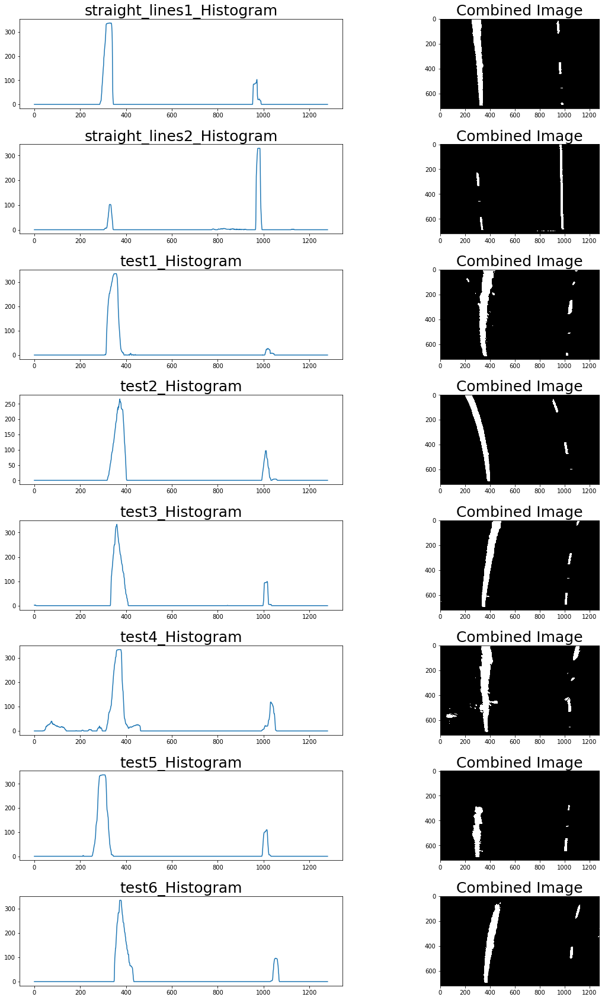

In [19]:
test_image_path = os.listdir(TestImagesPath)

f, axs = plt.subplots(8, 2, figsize=(20,30))
f.subplots_adjust(hspace = .4, wspace=.05)

for index,image in enumerate(test_image_path): 

    # Take a histogram of the bottom half of the image.
    histogram = calc_histogram(combined_image_output_list[index])
    
    axs[index,0].plot(histogram)
    axs[index,0].set_title(image.split(".")[0] + "_Histogram", fontsize=25)
    axs[index,1].imshow(combined_image_output_list[index],cmap='gray')
    axs[index,1].set_title("Combined Image", fontsize=25)
    
plt.show()    

# Find Lines by Implement Sliding Windows and Fit a Polynomial

In [20]:
def Skip_FindingLines(img, left_fit, right_fit):
    
    ###################Variables Definations############################
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 90
    ###################################################################
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    #ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    #left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    #right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fit, right_fit, leftx, lefty, rightx, righty

In [21]:
def Find_Lines(img):
    
    ###################Variables Definations############################
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((img, img, img))*255
    
    # Choose the number of sliding windows
    nwindows = 15
    
    # Set the width of the windows +/- margin
    margin = 90
    
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Create global variables to save lines in them in case we have found the lines before
    # and searching isn't required again.
    global left_fit_glb, right_fit_glb
    
    ###################################################################
    
    # Take a histogram of the bottom half of the image
    histogram = calc_histogram(img)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    if (len(leftx) == 0 or len(rightx) == 0):
        
        # Get lines without using sliding window
        left_fit, right_fit, leftx, lefty, rightx, righty = Skip_FindingLines(out_img, left_fit_glb, right_fit_glb)
        
    else:
        
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
     
    left_fit_glb  = left_fit
    right_fit_glb = right_fit
    
    return out_img, left_fit_glb, right_fit_glb, leftx, lefty, rightx, righty


def Visualize_Lines(img):
    
    OutImg, LeftFitGlb, RightFitGlb, LeftX, LeftY, RightX, RightY  = Find_Lines(img)
    
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx  = LeftFitGlb[0]*ploty**2 + LeftFitGlb[1]*ploty + LeftFitGlb[2]
    right_fitx = RightFitGlb[0]*ploty**2 + RightFitGlb[1]*ploty + RightFitGlb[2]

    #plt.imshow(OutImg,cmap='gray')
    
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    #plt.xlim(0, 1280)
    #plt.ylim(720, 0)
    #plt.show()
    
    return LeftFitGlb, RightFitGlb, LeftX, LeftY, RightX, RightY, left_fitx, right_fitx 


# Get Lines Radius

In [22]:
def Get_Curvature(leftx, lefty, rightx, righty):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty) + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(righty) + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Now return our radius of curvature in meters
    return left_curverad, right_curverad

# Draw Lines on Original Images

In [23]:
def draw_lines(image, warped, left_fitx, right_fitx, Minv):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)

    return result

In [24]:
# 

In [25]:
def plot_data(image, Radius, leftfitx, rightfitx):
    
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    Vehicle_pos = image.shape[1]//2
    middle = (leftfitx[-1] + rightfitx[-1])//2
    dx = (Vehicle_pos - middle) * xm_per_pix # Positive if on right, Negative on left
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(image,'Left radius of curvature  = %.2f m'%(Radius[0]),(50,50), font, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(image,'Right radius of curvature = %.2f m'%(Radius[1]),(50,80), font, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(image,'Vehicle position : %.2f m %s of center'%(abs(dx), 'left' if dx < 0 else 'right'),(50,110), font, 1,(255,255,255),2,cv2.LINE_AA)

    return image

# Finding Lines Pipeline

In [26]:
def Lines_Pipeline(PassedImage):
    
    cal_coefficients = pickle.load(open("calibration_coefficients.p", 'rb'))
    
    # source needed for the presepective transform
    src = np.float32([(575,460), (720,460), (100,720), (1200,720)])

    # destination needed for the prespective transform
    dest = np.float32([(250,0), 
                       (1050,0), 
                       (250,700), 
                       (1050,700)
                      ])
    
    # undistort the selected image.
    undist_image = undistort_image(PassedImage, cal_coefficients["mtx"], cal_coefficients["dist"])

    # Apply different thresholds in order to detect the line perfectly.
    combined_image = combined_thresholds(undist_image)
    
    # warp the selected image.
    warped_image, Matx, Matx_inv = warper(combined_image, src, dest)

    # Find Lines
    LeftFitGlb, RightFitGlb, LeftX, LeftY, RightX, RightY, LeftFitX, RightFitx = Visualize_Lines(warped_image)
    
    # Get lines Radius
    Radius = Get_Curvature(LeftX, LeftY, RightX, RightY)
    
    # Draw lines on the original image
    output_image = draw_lines (PassedImage, warped_image, LeftFitX, RightFitx, Matx_inv_list[index])
    
    Final_image = plot_data (output_image, Radius, LeftFitX, RightFitx)
    
    return Final_image
    
    #plt.title(image.split(".")[0] + "_Final")
    #plt.imshow(Final_image)
    #plt.show()
    #print(Data)
    #print(LeftCurve, 'm,', RightCurve, 'm')
    

# Run Project Video

In [27]:
project_video_output = 'project_video_output.mp4'
project_video = VideoFileClip("project_video.mp4")
project_video_output_data = project_video.fl_image(Lines_Pipeline) #NOTE: this function expects color images!!
%time project_video_output_data.write_videofile(project_video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|██████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [02:35<00:00,  8.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 2min 36s


# Run challenge Video

In [29]:
challenge_video_output = 'challenge_video_output.mp4'
challenge_video = VideoFileClip("challenge_video.mp4")
challenge_video_output_data = challenge_video.fl_image(Lines_Pipeline) #NOTE: this function expects color images!!
%time challenge_video_output_data.write_videofile(challenge_video_output, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████████| 485/485 [00:55<00:00,  8.05it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

Wall time: 56.5 s


# Run Harder Challenge Video

In [30]:
harder_challenge_video_output = 'harder_challenge_video_output.mp4'
harder_challenge_video = VideoFileClip("harder_challenge_video.mp4")
harder_challenge_video_output_data = harder_challenge_video.fl_image(Lines_Pipeline) #NOTE: this function expects color images!!
%time harder_challenge_video_output_data.write_videofile(harder_challenge_video_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|██████████████████████████████████████████████████████████████████████████████▉| 1199/1200 [03:43<00:00,  4.56it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

Wall time: 3min 45s


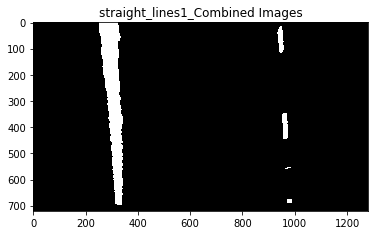

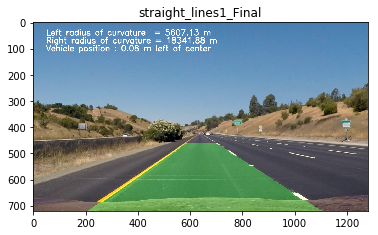

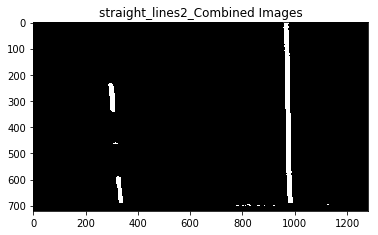

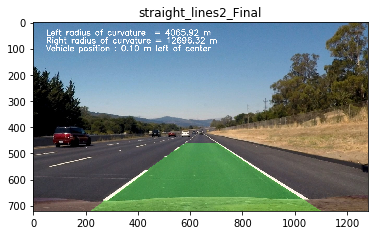

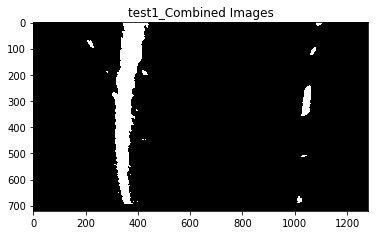

...

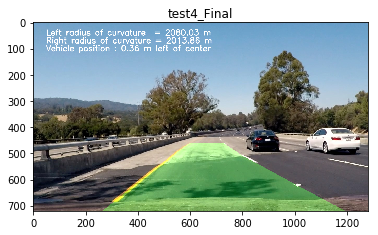

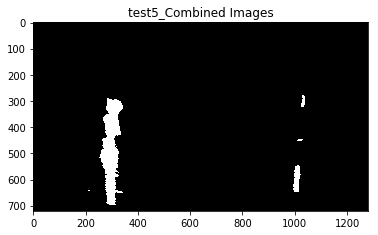

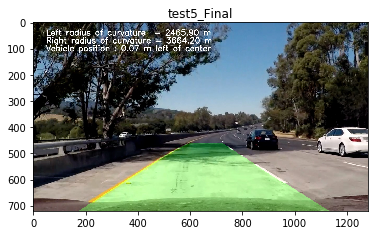

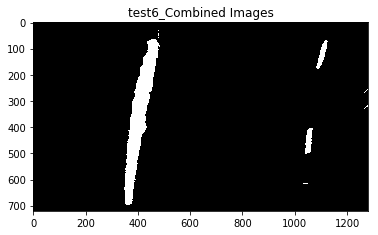

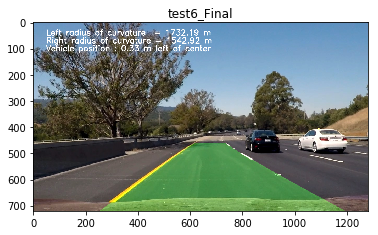

In [31]:
test_image_path = os.listdir(TestImagesPath)

#f, axs = plt.subplots(8, 2, figsize=(20,30))
#f.subplots_adjust(hspace = .4, wspace=.05)

for index,image in enumerate(test_image_path):
    
    test_image = mpimg.imread(TestImagesPath+image)
    
    plt.title(image.split(".")[0] + "_Combined Images")
    plt.imshow(combined_image_output_list[index],cmap='gray')
    plt.show()
    
    # Visualize Lines of binary images.
    plt.title(image.split(".")[0] + "_with Lines")
    LeftFitGlb, RightFitGlb, LeftX, LeftY, RightX, RightY, LeftFitX, RightFitx = Visualize_Lines(combined_image_output_list[index])
    
    Radius = Get_Curvature(LeftX, LeftY, RightX, RightY)
    
    output_image = draw_lines (test_image, combined_image_output_list[index], LeftFitX, RightFitx, Matx_inv_list[index])
    Final_image = plot_data (output_image, Radius, LeftFitX, RightFitx)
    
    plt.title(image.split(".")[0] + "_Final")
    plt.imshow(Final_image)
    plt.show()
    #print(Data)
    #print(LeftCurve, 'm,', RightCurve, 'm')
    